In [ ]:
# === Section 0: Install dependencies ===
!pip install -q transformers torchaudio librosa soundfile scikit-learn seaborn

In [ ]:
# === Section 0: Mount Drive ===
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# === Section 0: Imports + Global Config ===
import os, json, time, glob, warnings, gc, re
from pathlib import Path
from collections import defaultdict, Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm

import torch
import librosa

from sklearn.metrics import (classification_report, confusion_matrix,
                              f1_score, accuracy_score, roc_auc_score)

warnings.filterwarnings('ignore')
sns.set_theme(style='whitegrid')

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Device: {device}')
if device == 'cuda':
    print(f'GPU: {torch.cuda.get_device_name(0)}')

DRIVE_BASE      = '/content/drive/MyDrive/ThaiScamCall'
REAL_AUDIO_DIR  = f'{DRIVE_BASE}/real_audio'
OUT_DIR         = f'{DRIVE_BASE}/runs/experiment2'
TEXT_CLEAN      = f'{DRIVE_BASE}/models/phayathai_scam'
WHISPER_CLEAN   = f'{DRIVE_BASE}/models/whisper_enc_scam'

os.makedirs(REAL_AUDIO_DIR, exist_ok=True)
os.makedirs(OUT_DIR, exist_ok=True)

CLASS_NAMES = ['not_scam', 'scam']
SR = 16000

# ===== Overlap Sliding Window Config (both Two-stage + E2E) =====
CHUNK_SEC = 5             # ⭐ slide forward 5s/รอบ
MAX_CONTEXT_SEC = 15      # ⭐ max context = 15s (match training)
#
# Window pattern (เหมือนกันทั้ง 2 model):
#   รอบ 1: 0-5    (5s)
#   รอบ 2: 0-10   (10s)
#   รอบ 3: 0-15   (15s — max)
#   รอบ 4: 5-20   (slide forward)
#   รอบ 5: 10-25  (slide)
#   รอบ 6: 15-30  (slide)
#   ...

TEST_SET_F1 = {'two_stage': 0.9958, 'e2e': 0.9901}

print(f'✅ Setup OK')
print(f'   Chunk: {CHUNK_SEC}s/รอบ, Max context: {MAX_CONTEXT_SEC}s')
print(f'   Pattern: 0-5, 0-10, 0-15, 5-20, 10-25, ...')
print(f'   เหมือนกันทั้ง Two-stage + E2E')

Device: cuda
GPU: Tesla T4
✅ Setup OK
   Chunk: 5s/รอบ, Max context: 15s
   Pattern: 0-5, 0-10, 0-15, 5-20, 10-25, ...
   เหมือนกันทั้ง Two-stage + E2E


In [ ]:
# === Section 1: Auto-create metadata.csv ===
audio_files = sorted([f for f in os.listdir(REAL_AUDIO_DIR)
                      if f.endswith(('.mp3', '.wav', '.m4a'))])
assert audio_files, f'❌ ไม่มีไฟล์เสียงใน {REAL_AUDIO_DIR}'

def detect_label(fn):
    fn_lower = fn.lower()
    if 'notscam' in fn_lower or 'not_scam' in fn_lower: return 0
    if 'scam' in fn_lower: return 1
    return None

meta = pd.DataFrame([{
    'filename': f, 'label': detect_label(f),
    'speaker':  'tiktok', 'source': 'tiktok',
} for f in audio_files])

assert meta.label.notna().all(), '❌ มีไฟล์ที่ detect label ไม่ได้'
meta['label'] = meta.label.astype(int)
meta.to_csv(f'{REAL_AUDIO_DIR}/metadata.csv', index=False)

# Duration check
durations = []
for fn in meta.filename:
    try:
        durations.append(librosa.get_duration(path=f'{REAL_AUDIO_DIR}/{fn}'))
    except Exception as e:
        print(f'❌ {fn}: {e}')
        durations.append(None)
meta['duration'] = durations
meta['n_rounds'] = (meta.duration / CHUNK_SEC).astype(int)

print(f'Total: {len(meta)} files')
print(meta.label.value_counts().rename({0: 'not_scam', 1: 'scam'}))
print()
print(meta[['filename', 'label', 'duration', 'n_rounds']].to_string(index=False))

# Filter ไฟล์สั้นเกิน
meta = meta[meta.duration >= CHUNK_SEC].reset_index(drop=True)
print(f'\n✅ พร้อมใช้: {len(meta)} ไฟล์')

Total: 5 files
label
scam        4
not_scam    1
Name: count, dtype: int64

        filename  label   duration  n_rounds
rw_notscam03.mp3      0  30.375692         6
   rw_scam02.mp3      1 636.244875       127
   rw_scam03.mp3      1 210.222381        42
   rw_scam04.mp3      1  76.089229        15
   rw_scam06.mp3      1  60.000363        12

✅ พร้อมใช้: 5 ไฟล์


In [ ]:
# === Section 2: Load 3 models ===
from transformers import (AutoProcessor, AutoModelForSpeechSeq2Seq,
                          AutoTokenizer, AutoModelForSequenceClassification,
                          AutoFeatureExtractor, AutoModelForAudioClassification)

ASR_MODEL_ID = 'biodatlab/whisper-th-medium-combined'

asr_processor = AutoProcessor.from_pretrained(ASR_MODEL_ID)
asr_model = AutoModelForSpeechSeq2Seq.from_pretrained(
    ASR_MODEL_ID, torch_dtype=torch.float16 if device == 'cuda' else torch.float32
).to(device).eval()
asr_forced_ids = asr_processor.get_decoder_prompt_ids(language='th', task='transcribe')
print('✅ ASR loaded')

text_tok = AutoTokenizer.from_pretrained(TEXT_CLEAN)
text_model = AutoModelForSequenceClassification.from_pretrained(TEXT_CLEAN).to(device).eval()
print('✅ Text classifier loaded')

whisper_fe = AutoFeatureExtractor.from_pretrained(WHISPER_CLEAN)
whisper_model = AutoModelForAudioClassification.from_pretrained(WHISPER_CLEAN).to(device).eval()
print('✅ Whisper E2E loaded')

preprocessor_config.json:   0%|          | 0.00/339 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.29k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/283k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/836k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.48M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/494k [00:00<?, ?B/s]

normalizer.json:   0%|          | 0.00/52.7k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/34.6k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.19k [00:00<?, ?B/s]

[transformers] `torch_dtype` is deprecated! Use `dtype` instead!


model.safetensors:   0%|          | 0.00/1.63G [00:00<?, ?B/s]

Loading weights:   0%|          | 0/948 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/3.75k [00:00<?, ?B/s]

✅ ASR loaded


Loading weights:   0%|          | 0/201 [00:00<?, ?it/s]

✅ Text classifier loaded


Loading weights:   0%|          | 0/191 [00:00<?, ?it/s]

✅ Whisper E2E loaded


In [ ]:
# === Section 3: Basic inference + bounded streaming/growing ===

@torch.no_grad()
def asr_transcribe(audio_chunk, sr=SR):
    inputs = asr_processor(audio_chunk, sampling_rate=sr, return_tensors='pt')
    inputs = {k: v.to(device, dtype=asr_model.dtype if v.dtype == torch.float32 else v.dtype)
              for k, v in inputs.items()}
    gen = asr_model.generate(**inputs, forced_decoder_ids=asr_forced_ids, max_new_tokens=128)
    return asr_processor.batch_decode(gen, skip_special_tokens=True)[0]

@torch.no_grad()
def text_classify(text):
    enc = text_tok(text, truncation=True, max_length=256, return_tensors='pt').to(device)
    logits = text_model(**enc).logits
    return torch.softmax(logits, dim=-1).cpu().numpy()[0]

@torch.no_grad()
def whisper_classify(audio_chunk, sr=SR):
    inputs = whisper_fe(audio_chunk, sampling_rate=sr, return_tensors='pt')
    inputs = {k: v.to(device) for k, v in inputs.items()}
    logits = whisper_model(**inputs).logits
    return torch.softmax(logits, dim=-1).cpu().numpy()[0]


# Two-stage Streaming Concat — BOUNDED context (keep last N=max/chunk ASR results)
def predict_two_stage_streaming(audio_path, chunk_sec=CHUNK_SEC,
                                 max_context_sec=MAX_CONTEXT_SEC, sr=SR):
    """
    ASR each 5s chunk → keep last (max_context_sec/chunk_sec) chunks of text.
    Pattern: text covers audio 0-5, 0-10, 0-15, 0-20, 5-25, 10-30...
    """
    wav, _ = librosa.load(audio_path, sr=sr)
    duration = len(wav) / sr
    max_chunks = int(max_context_sec / chunk_sec)
    text_history = []   # list of recent ASR texts
    rows = []
    for round_idx, start in enumerate(np.arange(0, duration - chunk_sec + 0.1, chunk_sec)):
        chunk = wav[int(start*sr):int((start+chunk_sec)*sr)]
        t0 = time.time()
        new_text = asr_transcribe(chunk)             # ASR เฉพาะ 5s ใหม่
        text_history.append(new_text)
        if len(text_history) > max_chunks:           # slide window
            text_history = text_history[-max_chunks:]
        accumulated_text = ' '.join(text_history).strip()
        prob = text_classify(accumulated_text)        # classify ทั้ง context

        # คำนวณ audio range ของ context ปัจจุบัน
        n_active = len(text_history)
        window_start = (round_idx + 1 - n_active) * chunk_sec
        window_end   = (round_idx + 1) * chunk_sec

        rows.append({
            'round':            round_idx + 1,
            'window_start_sec': float(window_start),   # เริ่มของ context window
            'window_end_sec':   float(window_end),     # จบของ context window
            'context_sec':      float(window_end - window_start),  # ความยาว context
            'prob_scam':        float(prob[1]),
            'pred':             int(prob[1] > 0.5),
            'latency':          time.time() - t0,
            'transcript':       accumulated_text[:300],
        })
    return pd.DataFrame(rows)


# E2E Growing/Sliding Audio Window — same pattern at audio level
def predict_e2e_growing(audio_path, chunk_sec=CHUNK_SEC,
                        max_context_sec=MAX_CONTEXT_SEC, sr=SR):
    """
    Pattern: audio[0:5], audio[0:10], audio[0:15], audio[0:20], audio[5:25], audio[10:30]...
    """
    wav, _ = librosa.load(audio_path, sr=sr)
    duration = len(wav) / sr
    rows = []
    for round_idx, end in enumerate(np.arange(chunk_sec, duration + 0.1, chunk_sec)):
        start = 0 if end <= max_context_sec else end - max_context_sec
        chunk = wav[int(start*sr):int(end*sr)]
        t0 = time.time()
        prob = whisper_classify(chunk)
        rows.append({
            'round':            round_idx + 1,
            'window_start_sec': float(start),
            'window_end_sec':   float(end),
            'context_sec':      float(end - start),
            'prob_scam':        float(prob[1]),
            'pred':             int(prob[1] > 0.5),
            'latency':          time.time() - t0,
        })
    return pd.DataFrame(rows)


def time_to_first_detection(df, threshold=0.7):
    triggered = df[df.prob_scam > threshold]
    return None if len(triggered) == 0 else float(triggered.iloc[0].window_end_sec)

print(f'✅ Functions ready')
print(f'   Max context: {MAX_CONTEXT_SEC}s')
print(f'   Round 1-{MAX_CONTEXT_SEC//CHUNK_SEC}: growing (0→{MAX_CONTEXT_SEC}s)')
print(f'   Round {MAX_CONTEXT_SEC//CHUNK_SEC+1}+: sliding forward {CHUNK_SEC}s/รอบ')

✅ Functions ready
   Max context: 15s
   Round 1-3: growing (0→15s)
   Round 4+: sliding forward 5s/รอบ


In [ ]:
# === Section 4: Run 2 experiments ===
EXPERIMENTS = [
    {'name': 'two_stage_streaming', 'model': 'two_stage'},
    {'name': 'e2e_growing',         'model': 'e2e'},
]

all_results = {}

for exp in EXPERIMENTS:
    print(f'\n=== {exp["name"]} ===')
    rows = []
    for _, m in tqdm(meta.iterrows(), total=len(meta), desc=exp['name']):
        try:
            audio_path = f'{REAL_AUDIO_DIR}/{m.filename}'
            if exp['model'] == 'two_stage':
                df = predict_two_stage_streaming(audio_path)
            else:
                df = predict_e2e_growing(audio_path)
        except Exception as e:
            print(f'❌ {m.filename}: {e}')
            continue
        if len(df) == 0: continue
        df['filename'] = m.filename
        df['true_label'] = m.label
        df['speaker'] = m.speaker
        rows.append(df)

    if rows:
        all_results[exp['name']] = pd.concat(rows, ignore_index=True, sort=False)
        all_results[exp['name']].to_csv(f'{OUT_DIR}/{exp["name"]}_rounds.csv', index=False)
        n_rounds = all_results[exp['name']].groupby('filename').size().mean()
        avg_lat = all_results[exp['name']].latency.mean()
        print(f'  → {n_rounds:.1f} rounds/file, avg latency {avg_lat:.2f}s/round')

print(f'\n✅ Done — {len(all_results)} experiments')


=== two_stage_streaming ===


two_stage_streaming:   0%|          | 0/5 [00:00<?, ?it/s]

[transformers] Using custom `forced_decoder_ids` from the (generation) config. This is deprecated in favor of the `task` and `language` flags/config options.
[transformers] The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
[transformers] Both `max_new_tokens` (=128) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] A custom logits processor of type <class 'transformers.generation.logits_process.SuppressTokensLogitsProcessor'> has been passed to `.generate()`, but it was also created in `.generate()`, given its parameterization. The custom <class 'transformers.generation.logits_process.SuppressTokensLogitsProcessor'> will take p

  → 40.0 rounds/file, avg latency 1.07s/round

=== e2e_growing ===


e2e_growing:   0%|          | 0/5 [00:00<?, ?it/s]

  → 40.0 rounds/file, avg latency 0.12s/round

✅ Done — 2 experiments


In [ ]:
# === Section 5: F1 per file (final prediction per call) ===
# กลยุทธ์: ใช้ prediction รอบสุดท้าย (มี context มากสุด)

STRATEGIES = ['final', 'max_conf', 'any', 'mean']

def aggregate(df, strategy='final'):
    if strategy == 'final':                              # ใช้รอบสุดท้าย
        return int(df.iloc[-1].pred)
    if strategy == 'max_conf':                           # รอบที่มั่นใจสุด
        idx = (df.prob_scam - 0.5).abs().idxmax()
        return int(df.loc[idx, 'pred'])
    if strategy == 'any':                                # มีรอบไหน trigger
        return int((df.prob_scam > 0.5).any())
    if strategy == 'mean':                               # เฉลี่ย prob
        return int(df.prob_scam.mean() > 0.5)

summary_rows = []
for exp_name, wdf in all_results.items():
    for strategy in STRATEGIES:
        calls = []
        for fn, group in wdf.groupby('filename'):
            calls.append({
                'filename': fn,
                'true': group.true_label.iloc[0],
                'pred': aggregate(group, strategy),
                'ttfd': time_to_first_detection(group),
                'total_latency': group.latency.sum(),
                'n_rounds': len(group),
            })
        cdf = pd.DataFrame(calls)
        y, p = cdf.true.values, cdf.pred.values
        summary_rows.append({
            'experiment':    exp_name,
            'strategy':      strategy,
            'macro_f1':      f1_score(y, p, average='macro'),
            'accuracy':      accuracy_score(y, p),
            'f1_scam':       f1_score(y, p, pos_label=1, zero_division=0),
            'avg_ttfd':      cdf.ttfd.mean(),
            'avg_total_lat': cdf.total_latency.mean(),
            'avg_lat_per_round': wdf.latency.mean(),
        })

summary = pd.DataFrame(summary_rows).round(4)
summary.to_csv(f'{OUT_DIR}/summary.csv', index=False)
display(summary)

,experiment,strategy,macro_f1,accuracy,f1_scam,avg_ttfd,avg_total_lat,avg_lat_per_round
0,two_stage_streaming,final,0.1667,0.2,0.0000,35.0,42.7221,1.0681
1,two_stage_streaming,max_conf,0.5833,0.6,0.6667,35.0,42.7221,1.0681
2,two_stage_streaming,any,0.7619,0.8,0.8571,35.0,42.7221,1.0681
3,two_stage_streaming,mean,0.4000,0.4,0.4000,35.0,42.7221,1.0681
4,e2e_growing,final,0.1667,0.2,0.0000,140.0,4.9710,0.1243
5,e2e_growing,max_conf,0.1667,0.2,0.0000,140.0,4.9710,0.1243
6,e2e_growing,any,0.4000,0.4,0.4000,140.0,4.9710,0.1243
7,e2e_growing,mean,0.1667,0.2,0.0000,140.0,4.9710,0.1243


In [ ]:
# === Section 6: F1 evolution — context สะสมแต่ละรอบให้ F1 เท่าไหร่ ===
# จำลอง: ถ้า deploy แล้วต้อง decide ที่รอบที่ N → F1 = ?

f1_evolution = []
for exp_name, wdf in all_results.items():
    # ที่แต่ละ round, ใช้ prediction ของรอบนั้นเทียบกับ true label
    max_round = wdf['round'].max()
    for r in range(1, int(max_round) + 1):
        sub = wdf[wdf['round'] == r]
        if len(sub) < 3: continue   # ไฟล์ที่ยาวพอ
        y, p = sub.true_label.values, sub.pred.values
        f1_evolution.append({
            'experiment':  exp_name,
            'round':       r,
            'context_sec': sub.context_sec.iloc[0],
            'n_files':     len(sub),
            'macro_f1':    f1_score(y, p, average='macro', zero_division=0),
            'avg_prob_scam': sub.prob_scam.mean(),
            'avg_latency': sub.latency.mean(),
        })

f1_df = pd.DataFrame(f1_evolution).round(4)
f1_df.to_csv(f'{OUT_DIR}/f1_evolution.csv', index=False)
print('=== F1 evolution per round ===')
display(f1_df)

=== F1 evolution per round ===


,experiment,round,context_sec,n_files,macro_f1,avg_prob_scam,avg_latency
0,two_stage_streaming,1,5.0,5,0.1667,0.0273,1.7340
1,two_stage_streaming,2,10.0,5,0.1667,0.0006,1.1297
2,two_stage_streaming,3,15.0,5,0.1667,0.0015,1.0603
3,two_stage_streaming,4,15.0,5,0.4000,0.1226,1.2731
4,two_stage_streaming,5,15.0,5,0.4000,0.1949,1.1954
5,two_stage_streaming,6,15.0,5,0.4000,0.2224,1.2170
6,two_stage_streaming,7,15.0,4,0.2000,0.2559,0.7293
7,two_stage_streaming,8,15.0,4,0.2000,0.2628,1.1027
8,two_stage_streaming,9,15.0,4,0.2000,0.2860,0.8875
9,two_stage_streaming,10,15.0,4,0.4286,0.6779,0.9773


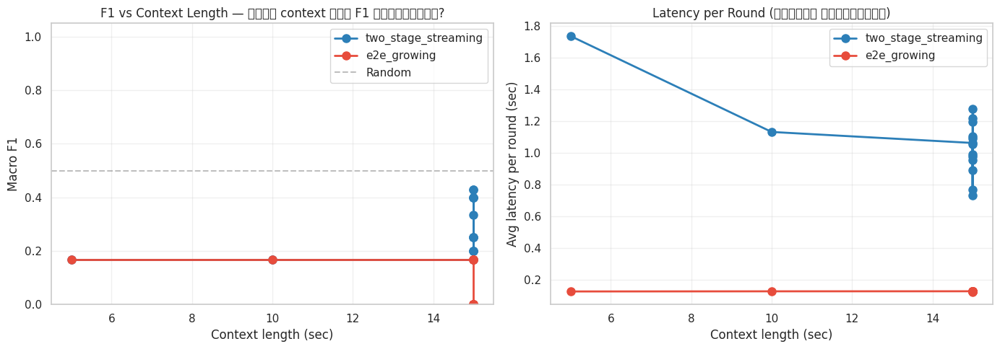

In [ ]:
# === Section 6: Plot F1 + Latency evolution ===
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1: F1 evolution — F1 dev as context grows
for exp_name, color in [('two_stage_streaming', '#2c7fb8'), ('e2e_growing', '#e74c3c')]:
    sub = f1_df[f1_df.experiment == exp_name].sort_values('round')
    axes[0].plot(sub.context_sec, sub.macro_f1, 'o-', label=exp_name,
                 markersize=8, linewidth=2, color=color)
axes[0].axhline(0.5, color='gray', linestyle='--', alpha=0.5, label='Random')
axes[0].set_xlabel('Context length (sec)')
axes[0].set_ylabel('Macro F1')
axes[0].set_title('F1 vs Context Length — ยิ่ง context มาก F1 ดีขึ้นไหม?')
axes[0].legend(); axes[0].grid(alpha=0.3); axes[0].set_ylim(0, 1.05)

# Plot 2: Latency per round
for exp_name, color in [('two_stage_streaming', '#2c7fb8'), ('e2e_growing', '#e74c3c')]:
    sub = f1_df[f1_df.experiment == exp_name].sort_values('round')
    axes[1].plot(sub.context_sec, sub.avg_latency, 'o-', label=exp_name,
                 markersize=8, linewidth=2, color=color)
axes[1].set_xlabel('Context length (sec)')
axes[1].set_ylabel('Avg latency per round (sec)')
axes[1].set_title('Latency per Round (ต่อรอบ ไม่ใช่รวม)')
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig(f'{OUT_DIR}/evolution.png', dpi=150, bbox_inches='tight')
plt.show()

=== Best per experiment ===


,experiment,strategy,macro_f1,test_set_f1,drop,avg_ttfd,avg_lat_per_round
6,e2e_growing,any,0.4000,0.9901,0.5901,140.0,0.1243
2,two_stage_streaming,any,0.7619,0.9958,0.2339,35.0,1.0681


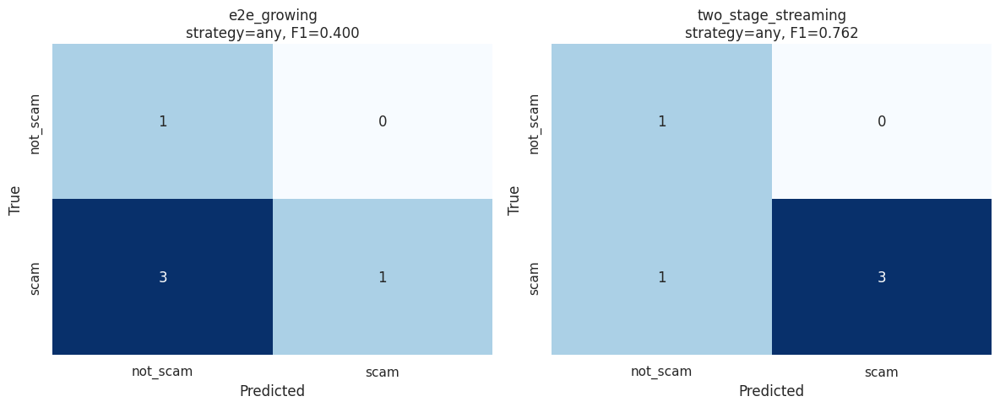

In [ ]:
# === Section 7: Best per experiment + Confusion matrix ===
best = summary.loc[summary.groupby('experiment').macro_f1.idxmax()].copy()
best['model'] = best.experiment.apply(lambda x: 'two_stage' if 'two_stage' in x else 'e2e')
best['test_set_f1'] = best.model.map(TEST_SET_F1)
best['drop'] = best.test_set_f1 - best.macro_f1

print('=== Best per experiment ===')
display(best[['experiment', 'strategy', 'macro_f1', 'test_set_f1', 'drop',
              'avg_ttfd', 'avg_lat_per_round']].round(4))

# Confusion matrices side-by-side
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
for ax, (_, row) in zip(axes, best.iterrows()):
    exp_name = row.experiment
    strategy = row.strategy
    wdf = all_results[exp_name]
    calls = []
    for fn, group in wdf.groupby('filename'):
        calls.append({'true': int(group.true_label.iloc[0]),
                      'pred': aggregate(group, strategy)})
    cdf = pd.DataFrame(calls)
    cm = confusion_matrix(cdf.true, cdf.pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax)
    ax.set_xlabel('Predicted'); ax.set_ylabel('True')
    ax.set_title(f'{exp_name}\nstrategy={strategy}, F1={row.macro_f1:.3f}')
plt.tight_layout()
plt.savefig(f'{OUT_DIR}/confusion.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# === Section 7.5: Error Inspection — ดูเคสที่ทายผิด ===
import IPython.display as ipd

INSPECT_EXP   = 'two_stage_streaming'   # 🔧 หรือ 'e2e_growing'
INSPECT_STRAT = 'any'                    # 🔧 strategy

wdf = all_results[INSPECT_EXP]

errors = []
for fn, g in wdf.groupby('filename'):
    true_label = int(g.true_label.iloc[0])
    pred = aggregate(g, INSPECT_STRAT)
    if pred != true_label:
        errors.append({
            'filename':  fn,
            'true':      CLASS_NAMES[true_label],
            'pred':      CLASS_NAMES[pred],
            'mean_prob': g.prob_scam.mean(),
            'max_prob':  g.prob_scam.max(),
            'min_prob':  g.prob_scam.min(),
            'n_rounds':  len(g),
        })

err_df = pd.DataFrame(errors)
print(f'=== {INSPECT_EXP} (strategy={INSPECT_STRAT}) ===')
print(f'ทายผิด {len(err_df)} ไฟล์\n')

if len(err_df) > 0:
    display(err_df.round(3))
    print('\n🔊 === รายละเอียดเคสที่ผิด ===')
    for _, e in err_df.iterrows():
        fn = e['filename']
        g = wdf[wdf.filename == fn].sort_values('round')
        wav, _ = librosa.load(f'{REAL_AUDIO_DIR}/{fn}', sr=SR)

        print(f'\n{"="*60}')
        print(f'📁 {fn}')
        print(f'   True: {e["true"]} | Predicted: {e["pred"]} ❌')
        print(f'   prob_scam: min={e["min_prob"]:.2f}, max={e["max_prob"]:.2f}, mean={e["mean_prob"]:.2f}')
        print(f'   Duration: {len(wav)/SR:.0f}s, {e["n_rounds"]} rounds')

        print(f'\n   Prob trajectory:')
        for _, r in g.iterrows():
            bar = '█' * int(r.prob_scam * 20)
            print(f'     รอบ {int(r["round"])} [{r.window_start_sec:.0f}-{r.window_end_sec:.0f}s]: '
                  f'{r.prob_scam:.2f} {bar}')

        if 'transcript' in g.columns:
            last_text = g.iloc[-1].transcript
            if isinstance(last_text, str) and last_text:
                print(f'\n   📝 Transcript: "{last_text[:200]}"')

        print(f'\n   🔊 ฟังเสียงเต็ม:')
        ipd.display(ipd.Audio(wav, rate=SR))
else:
    print('✅ ไม่มีเคสผิด!')

=== two_stage_streaming (strategy=any) ===
ทายผิด 1 ไฟล์



,filename,true,pred,mean_prob,max_prob,min_prob,n_rounds
0,rw_scam03.mp3,scam,not_scam,0.014,0.145,0.0,41



🔊 === รายละเอียดเคสที่ผิด ===

📁 rw_scam03.mp3
   True: scam | Predicted: not_scam ❌
   prob_scam: min=0.00, max=0.14, mean=0.01
   Duration: 210s, 41 rounds

   Prob trajectory:
     รอบ 1 [0-5s]: 0.00 
     รอบ 2 [0-10s]: 0.00 
     รอบ 3 [0-15s]: 0.00 
     รอบ 4 [5-20s]: 0.00 
     รอบ 5 [10-25s]: 0.00 
     รอบ 6 [15-30s]: 0.06 █
     รอบ 7 [20-35s]: 0.00 
     รอบ 8 [25-40s]: 0.02 
     รอบ 9 [30-45s]: 0.14 ██
     รอบ 10 [35-50s]: 0.00 
     รอบ 11 [40-55s]: 0.00 
     รอบ 12 [45-60s]: 0.14 ██
     รอบ 13 [50-65s]: 0.01 
     รอบ 14 [55-70s]: 0.11 ██
     รอบ 15 [60-75s]: 0.00 
     รอบ 16 [65-80s]: 0.00 
     รอบ 17 [70-85s]: 0.01 
     รอบ 18 [75-90s]: 0.01 
     รอบ 19 [80-95s]: 0.00 
     รอบ 20 [85-100s]: 0.00 
     รอบ 21 [90-105s]: 0.00 
     รอบ 22 [95-110s]: 0.00 
     รอบ 23 [100-115s]: 0.00 
     รอบ 24 [105-120s]: 0.00 
     รอบ 25 [110-125s]: 0.01 
     รอบ 26 [115-130s]: 0.05 
     รอบ 27 [120-135s]: 0.00 
     รอบ 28 [125-140s]: 0.00 
     รอบ 29 [130-145s]: 0.00

{
  "config": {
    "chunk_sec": 5,
    "max_audio_sec": 15
  },
  "n_files": 5,
  "class_dist": {
    "1": 4,
    "0": 1
  },
  "best_experiment": "two_stage_streaming",
  "best_strategy": "any",
  "best_f1": 0.7619,
  "test_set_f1_ref": {
    "two_stage": 0.9958,
    "e2e": 0.9901
  },
  "generalization_gap": {
    "two_stage": 0.2339,
    "e2e": 0.5901
  },
  "latency_per_round": {
    "e2e_growing": 0.1314,
    "two_stage_streaming": 1.1371
  }
}


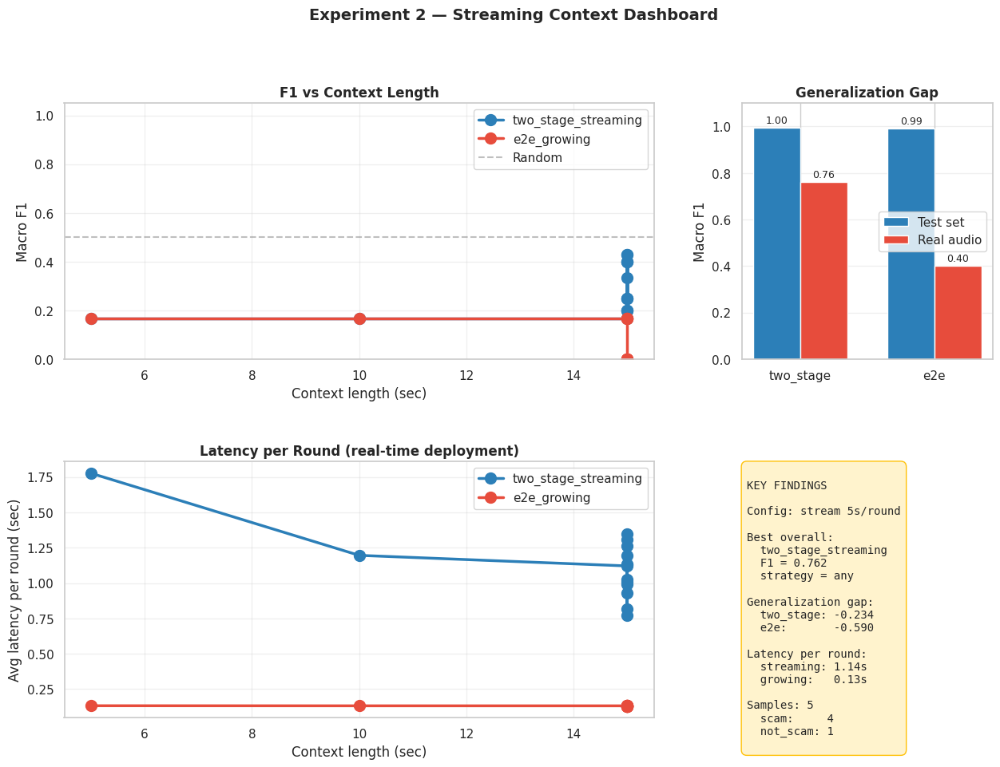


✅ Saved to /content/drive/MyDrive/ThaiScamCall/runs/experiment2/


In [ ]:
# === Section 8: Save report + FINAL DASHBOARD ===
models_list = ['two_stage', 'e2e']
real_f1 = {m: best[best.model == m].macro_f1.max() for m in models_list}
best_overall = best.sort_values('macro_f1', ascending=False).iloc[0]

report = {
    'config': {'chunk_sec': CHUNK_SEC, 'max_audio_sec': MAX_CONTEXT_SEC},
    'n_files': int(len(meta)),
    'class_dist': meta.label.value_counts().to_dict(),
    'best_experiment': best_overall.experiment,
    'best_strategy':   best_overall.strategy,
    'best_f1':         float(best_overall.macro_f1),
    'test_set_f1_ref': TEST_SET_F1,
    'generalization_gap': {m: float(TEST_SET_F1[m] - real_f1[m]) for m in models_list},
    'latency_per_round': {
        e: float(best[best.experiment == e].avg_lat_per_round.iloc[0])
        for e in best.experiment
    },
}
with open(f'{OUT_DIR}/report.json', 'w', encoding='utf-8') as f:
    json.dump(report, f, indent=2, ensure_ascii=False)
print(json.dumps(report, indent=2, ensure_ascii=False))

# Dashboard
fig = plt.figure(figsize=(15, 10))
gs = fig.add_gridspec(2, 3, hspace=0.4, wspace=0.35)

# Panel 1: F1 evolution
ax1 = fig.add_subplot(gs[0, :2])
for exp_name, color in [('two_stage_streaming', '#2c7fb8'), ('e2e_growing', '#e74c3c')]:
    sub = f1_df[f1_df.experiment == exp_name].sort_values('round')
    ax1.plot(sub.context_sec, sub.macro_f1, 'o-', label=exp_name,
             markersize=10, linewidth=2.5, color=color)
ax1.axhline(0.5, color='gray', linestyle='--', alpha=0.5, label='Random')
ax1.set_xlabel('Context length (sec)'); ax1.set_ylabel('Macro F1')
ax1.set_title('F1 vs Context Length', fontweight='bold')
ax1.legend(); ax1.grid(alpha=0.3); ax1.set_ylim(0, 1.05)

# Panel 2: Generalization gap
ax2 = fig.add_subplot(gs[0, 2])
test_list = [TEST_SET_F1[m] for m in models_list]
real_list = [real_f1[m] for m in models_list]
x_pos = np.arange(len(models_list)); width = 0.35
ax2.bar(x_pos - width/2, test_list, width, label='Test set', color='#2c7fb8')
ax2.bar(x_pos + width/2, real_list, width, label='Real audio', color='#e74c3c')
for i, (t, r) in enumerate(zip(test_list, real_list)):
    ax2.text(i - width/2, t + 0.02, f'{t:.2f}', ha='center', fontsize=9)
    ax2.text(i + width/2, r + 0.02, f'{r:.2f}', ha='center', fontsize=9)
ax2.set_xticks(x_pos); ax2.set_xticklabels(models_list)
ax2.set_ylabel('Macro F1'); ax2.set_title('Generalization Gap', fontweight='bold')
ax2.legend(); ax2.set_ylim(0, 1.1); ax2.grid(alpha=0.3, axis='y')

# Panel 3: Latency per round
ax3 = fig.add_subplot(gs[1, :2])
for exp_name, color in [('two_stage_streaming', '#2c7fb8'), ('e2e_growing', '#e74c3c')]:
    sub = f1_df[f1_df.experiment == exp_name].sort_values('round')
    ax3.plot(sub.context_sec, sub.avg_latency, 'o-', label=exp_name,
             markersize=10, linewidth=2.5, color=color)
ax3.set_xlabel('Context length (sec)'); ax3.set_ylabel('Avg latency per round (sec)')
ax3.set_title('Latency per Round (real-time deployment)', fontweight='bold')
ax3.legend(); ax3.grid(alpha=0.3)

# Panel 4: Summary text
ax4 = fig.add_subplot(gs[1, 2]); ax4.axis('off')
lat_two = best[best.experiment == 'two_stage_streaming'].avg_lat_per_round.iloc[0] if 'two_stage_streaming' in best.experiment.values else 0
lat_e2e = best[best.experiment == 'e2e_growing'].avg_lat_per_round.iloc[0] if 'e2e_growing' in best.experiment.values else 0

summary_text = f"""
KEY FINDINGS

Config: stream {CHUNK_SEC}s/round

Best overall:
  {best_overall.experiment}
  F1 = {best_overall.macro_f1:.3f}
  strategy = {best_overall.strategy}

Generalization gap:
  two_stage: -{TEST_SET_F1['two_stage'] - real_f1['two_stage']:.3f}
  e2e:       -{TEST_SET_F1['e2e'] - real_f1['e2e']:.3f}

Latency per round:
  streaming: {lat_two:.2f}s
  growing:   {lat_e2e:.2f}s

Samples: {len(meta)}
  scam:     {(meta.label==1).sum()}
  not_scam: {(meta.label==0).sum()}
"""
ax4.text(0.02, 0.98, summary_text, fontsize=10, family='monospace',
         verticalalignment='top', transform=ax4.transAxes,
         bbox=dict(boxstyle='round,pad=0.5', facecolor='#fff3cd', edgecolor='#ffc107'))

fig.suptitle('Experiment 2 — Streaming Context Dashboard',
             fontsize=14, fontweight='bold', y=1.00)
plt.savefig(f'{OUT_DIR}/dashboard.png', dpi=150, bbox_inches='tight', facecolor='white')
plt.show()
print(f'\n✅ Saved to {OUT_DIR}/')

=== Speed Metrics (RTF < 1 = เร็วกว่า real-time) ===


,experiment,lat_round_mean,lat_round_p50,lat_round_p95,RTF_mean,total_per_call,rounds_per_call
0,two_stage_streaming,1.137,1.141,1.616,0.227,45.484,40.0
1,e2e_growing,0.131,0.131,0.133,0.026,5.257,40.0


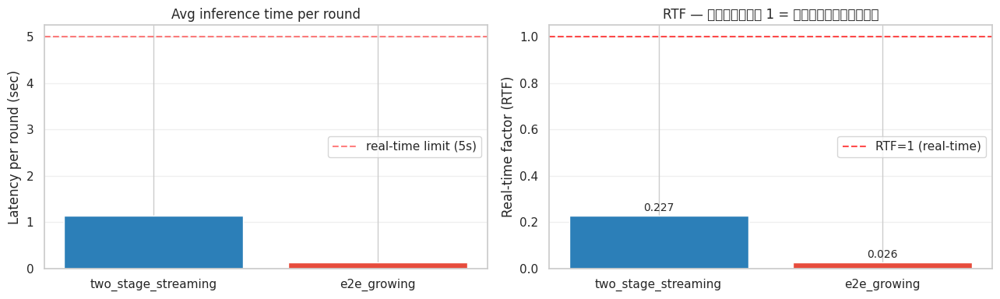

In [ ]:
# === Section 9: Speed Measurement (real-time deployment metric) ===
# Real-time factor (RTF) = latency_per_round / CHUNK_SEC
#   RTF < 1 = ประมวลผลเร็วกว่า real-time (ตามทันสายสด)
#   RTF > 1 = ช้ากว่า stream (ตามไม่ทัน)

speed_rows = []
for exp_name, wdf in all_results.items():
    per_round = wdf.latency
    per_call  = wdf.groupby('filename').latency.sum()
    rounds    = wdf.groupby('filename').size()
    rtf       = per_round / CHUNK_SEC
    speed_rows.append({
        'experiment':      exp_name,
        'lat_round_mean':  per_round.mean(),
        'lat_round_p50':   per_round.median(),
        'lat_round_p95':   per_round.quantile(0.95),
        'RTF_mean':        rtf.mean(),
        'total_per_call':  per_call.mean(),
        'rounds_per_call': rounds.mean(),
    })
speed_df = pd.DataFrame(speed_rows).round(3)
print('=== Speed Metrics (RTF < 1 = เร็วกว่า real-time) ===')
display(speed_df)
speed_df.to_csv(f'{OUT_DIR}/speed.csv', index=False)

fig, axes = plt.subplots(1, 2, figsize=(13, 4))
axes[0].bar(speed_df.experiment, speed_df.lat_round_mean, color=['#2c7fb8', '#e74c3c'])
axes[0].axhline(CHUNK_SEC, color='red', linestyle='--', alpha=0.5, label=f'real-time limit ({CHUNK_SEC}s)')
axes[0].set_ylabel('Latency per round (sec)')
axes[0].set_title('Avg inference time per round')
axes[0].legend(); axes[0].grid(alpha=0.3, axis='y')

axes[1].bar(speed_df.experiment, speed_df.RTF_mean, color=['#2c7fb8', '#e74c3c'])
axes[1].axhline(1.0, color='red', linestyle='--', alpha=0.7, label='RTF=1 (real-time)')
axes[1].set_ylabel('Real-time factor (RTF)')
axes[1].set_title('RTF — ต่ำกว่า 1 = ตามทันสายสด')
axes[1].legend(); axes[1].grid(alpha=0.3, axis='y')
for i, v in enumerate(speed_df.RTF_mean):
    axes[1].text(i, v + 0.02, f'{v:.3f}', ha='center', fontsize=10)

plt.tight_layout()
plt.savefig(f'{OUT_DIR}/speed.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# === Section 10: Sample inspection — ฟัง segment ที่ model predict แต่ละรอบ ===
import IPython.display as ipd

# 🔧 เลือกไฟล์ + experiment ที่อยากดู
INSPECT_FILE = meta.filename.iloc[0]          # เปลี่ยนชื่อไฟล์ได้
INSPECT_EXP  = 'two_stage_streaming'          # หรือ 'e2e_growing'

true_label = int(meta[meta.filename == INSPECT_FILE].label.iloc[0])
wdf = all_results[INSPECT_EXP]
sub = wdf[wdf.filename == INSPECT_FILE].sort_values('round')
wav, _ = librosa.load(f'{REAL_AUDIO_DIR}/{INSPECT_FILE}', sr=SR)

print(f'📁 File: {INSPECT_FILE}')
print(f'   True label: {CLASS_NAMES[true_label]}')
print(f'   Experiment: {INSPECT_EXP}')
print(f'   Duration: {len(wav)/SR:.1f}s\n')

print('🔊 === FULL AUDIO (ทั้งคลิป) ===')
ipd.display(ipd.Audio(wav, rate=SR))

print('\n🔊 === แต่ละรอบ (segment ที่ predict) ===')
for _, r in sub.iterrows():
    seg = wav[int(r.window_start_sec*SR):int(r.window_end_sec*SR)]
    flag = '🚨' if r.prob_scam > 0.5 else '✅'
    print(f'{flag} รอบ {int(r["round"])}: '
          f'[{r.window_start_sec:.0f}-{r.window_end_sec:.0f}s] '
          f'prob_scam={r.prob_scam:.2f} → {CLASS_NAMES[int(r.pred)]} '
          f'| latency={r.latency:.2f}s')
    if 'transcript' in r and isinstance(r.transcript, str) and r.transcript:
        print(f'    📝 "{r.transcript[:120]}"')
    ipd.display(ipd.Audio(seg, rate=SR))

📁 File: rw_notscam03.mp3
   True label: not_scam
   Experiment: two_stage_streaming
   Duration: 30.3s

🔊 === FULL AUDIO (ทั้งคลิป) ===



🔊 === แต่ละรอบ (segment ที่ predict) ===
✅ รอบ 1: [0-5s] prob_scam=0.00 → not_scam | latency=3.29s
    📝 "สวัสดีครับ พี่ ไลเดอร์ ลาลา มูฟ นะครับ เดี๋ยวมีปลาสต้าดุกเข้าไปส่งนะครับ"


✅ รอบ 2: [0-10s] prob_scam=0.00 → not_scam | latency=1.09s
    📝 "สวัสดีครับ พี่ ไลเดอร์ ลาลา มูฟ นะครับ เดี๋ยวมีปลาสต้าดุกเข้าไปส่งนะครับ วงข้าวเปลือกแสดงสดที่ บริษัท A-TECHงานเลี้ยงบริ"


✅ รอบ 3: [0-15s] prob_scam=0.00 → not_scam | latency=0.89s
    📝 "สวัสดีครับ พี่ ไลเดอร์ ลาลา มูฟ นะครับ เดี๋ยวมีปลาสต้าดุกเข้าไปส่งนะครับ วงข้าวเปลือกแสดงสดที่ บริษัท A-TECHงานเลี้ยงบริ"


✅ รอบ 4: [5-20s] prob_scam=0.00 → not_scam | latency=1.45s
    📝 "วงข้าวเปลือกแสดงสดที่ บริษัท A-TECHงานเลี้ยงบริษัท โอเคครับ สวัสดีครับเฮ้ สวัสดีครับ โอ๊ะ สวัสดีครับพี่ รายเดอร์ อาร่า ม"


✅ รอบ 5: [10-25s] prob_scam=0.00 → not_scam | latency=1.41s
    📝 "โอเคครับ สวัสดีครับเฮ้ สวัสดีครับ โอ๊ะ สวัสดีครับพี่ รายเดอร์ อาร่า มูฟ นะครับ เดี๋ยวมีพัสดุเข้าไปส่งนะครับ อ๋อ เอาหมาดุ"


✅ รอบ 6: [15-30s] prob_scam=0.00 → not_scam | latency=3.05s
    📝 "สวัสดีครับพี่ รายเดอร์ อาร่า มูฟ นะครับ เดี๋ยวมีพัสดุเข้าไปส่งนะครับ อ๋อ เอาหมาดุ อ่ะครับ ไม่ต้องกดเกร็ง โอเคครับ อย่าเส"


In [ ]:
# === Section 11: TTS (อันปกติ) vs Real audio — predict ทั้งคู่เทียบ ===
# Extract ไม่กี่ไฟล์ TTS full-length จาก mp3_full.zip → run pipeline เดียวกัน
import zipfile

SPLITS_DIR = f'{DRIVE_BASE}/splits'
TTS_DIR    = '/content/tts_sample'
os.makedirs(TTS_DIR, exist_ok=True)

# เลือก test files (balanced 3 scam + 3 not_scam)
test_df = pd.read_csv(f'{SPLITS_DIR}/test.csv')
picks = pd.concat([
    test_df[test_df.label == 1].head(3),
    test_df[test_df.label == 0].head(3),
]).reset_index(drop=True)

# Extract เฉพาะไฟล์ที่เลือก จาก mp3_full.zip (full-length TTS)
with zipfile.ZipFile(f'{DRIVE_BASE}/mp3_full.zip') as z:
    names = z.namelist()
    for fn in picks.filename:
        match = [n for n in names if n.endswith(fn)]
        if match:
            with z.open(match[0]) as src, open(f'{TTS_DIR}/{fn}', 'wb') as dst:
                dst.write(src.read())
print(f'Extracted {len(os.listdir(TTS_DIR))} TTS clips')

# Run streaming/growing บน TTS
tts_results = {}
for model_name, fn_predict in [('two_stage_streaming', predict_two_stage_streaming),
                                ('e2e_growing', predict_e2e_growing)]:
    rows = []
    for _, m in tqdm(picks.iterrows(), total=len(picks), desc=f'TTS/{model_name}'):
        path = f'{TTS_DIR}/{m.filename}'
        if not os.path.exists(path):
            continue
        try:
            df = fn_predict(path)
        except Exception as e:
            print(f'❌ {m.filename}: {e}')
            continue
        df['filename'] = m.filename
        df['true_label'] = m.label
        rows.append(df)
    if rows:
        tts_results[model_name] = pd.concat(rows, ignore_index=True, sort=False)

print('✅ TTS predictions done')

Extracted 6 TTS clips


TTS/two_stage_streaming:   0%|          | 0/6 [00:00<?, ?it/s]

[transformers] Both `max_new_tokens` (=128) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=128) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=128) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=128) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface

TTS/e2e_growing:   0%|          | 0/6 [00:00<?, ?it/s]

✅ TTS predictions done


=== TTS vs Real comparison ===


,source,experiment,f1_final,f1_any,lat_per_round,n_files
0,TTS (in-dist),two_stage_streaming,1.0000,1.0000,1.0825,6
1,TTS (in-dist),e2e_growing,1.0000,1.0000,0.1374,6
2,Real (TikTok),two_stage_streaming,0.1667,0.7619,1.1371,5
3,Real (TikTok),e2e_growing,0.1667,0.4000,0.1314,5


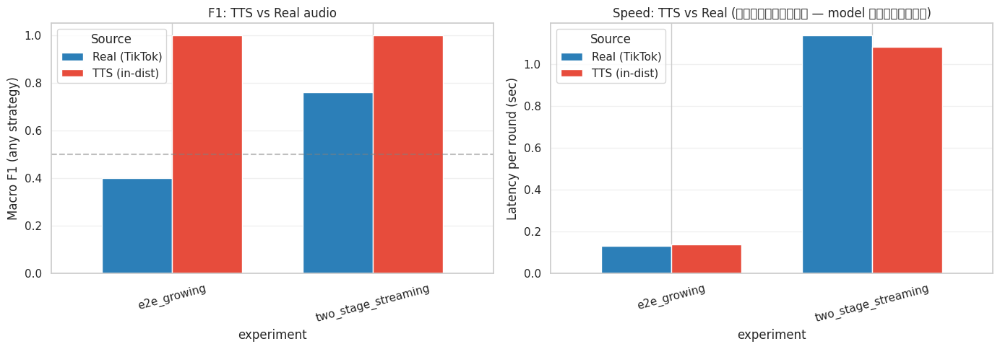


💡 คาดหวัง:
  - F1: TTS สูง (in-dist) > Real (generalization gap)
  - Speed: ใกล้กัน (model เดียวกัน, audio length เท่ากัน)


In [ ]:
# === Section 11: เทียบ TTS vs Real — F1 + Speed ===
def eval_source(results_dict, source_name):
    rows = []
    for exp_name, wdf in results_dict.items():
        # final prediction per file (รอบสุดท้าย) + any
        calls = []
        for fn, g in wdf.groupby('filename'):
            calls.append({
                'true': int(g.true_label.iloc[0]),
                'pred_final': int(g.iloc[-1].pred),
                'pred_any':   int((g.prob_scam > 0.5).any()),
            })
        cdf = pd.DataFrame(calls)
        rows.append({
            'source':       source_name,
            'experiment':   exp_name,
            'f1_final':     f1_score(cdf.true, cdf.pred_final, average='macro', zero_division=0),
            'f1_any':       f1_score(cdf.true, cdf.pred_any,   average='macro', zero_division=0),
            'lat_per_round': wdf.latency.mean(),
            'n_files':      cdf.shape[0],
        })
    return pd.DataFrame(rows)

cmp_tts  = eval_source(tts_results, 'TTS (in-dist)')
cmp_real = eval_source(all_results, 'Real (TikTok)')
comparison = pd.concat([cmp_tts, cmp_real], ignore_index=True).round(4)

print('=== TTS vs Real comparison ===')
display(comparison)
comparison.to_csv(f'{OUT_DIR}/tts_vs_real.csv', index=False)

# Plot F1 + speed side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# F1 grouped bar
pivot_f1 = comparison.pivot(index='experiment', columns='source', values='f1_any')
pivot_f1.plot(kind='bar', ax=axes[0], color=['#2c7fb8', '#e74c3c'], width=0.7)
axes[0].set_ylabel('Macro F1 (any strategy)')
axes[0].set_title('F1: TTS vs Real audio')
axes[0].axhline(0.5, color='gray', linestyle='--', alpha=0.5)
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=15)
axes[0].legend(title='Source'); axes[0].grid(alpha=0.3, axis='y'); axes[0].set_ylim(0, 1.05)

# Speed grouped bar
pivot_lat = comparison.pivot(index='experiment', columns='source', values='lat_per_round')
pivot_lat.plot(kind='bar', ax=axes[1], color=['#2c7fb8', '#e74c3c'], width=0.7)
axes[1].set_ylabel('Latency per round (sec)')
axes[1].set_title('Speed: TTS vs Real (ควรใกล้กัน — model เดียวกัน)')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=15)
axes[1].legend(title='Source'); axes[1].grid(alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig(f'{OUT_DIR}/tts_vs_real.png', dpi=150, bbox_inches='tight')
plt.show()

print('\n💡 คาดหวัง:')
print('  - F1: TTS สูง (in-dist) > Real (generalization gap)')
print('  - Speed: ใกล้กัน (model เดียวกัน, audio length เท่ากัน)')